# Scatter segmentation
Generate scatter plots and color the "markers" according the segments

In [1]:
import os
# fix root path to save outputs
actual_path = os.path.abspath(os.getcwd())
list_root_path = actual_path.split('/')[:-1]
root_path = '/'.join(list_root_path)
os.chdir(root_path)
print('root path: ', root_path)

root path:  /Users/joseortega/Documents/GitHub/exploratory-data-analysis-ds


### 0. Package and load data

In [2]:
from sklearn.datasets import fetch_california_housing
import json
import pandas as pd
import numpy as np

# plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

#### load data example segmentation
In this example there are the possible segmentation of the data to select:
- segmentation by target. custom segmentation. Price_segments
- segmentation by feature house age. custom segmentation. HouseAge_segments
- segmentation by MedInc. quintile segmentation. quartile_MedInc

In [3]:
# read data
data = pd.read_pickle('data/data_segmentation.pkl')

# define column that indice the segmentation of the data
column_segment = 'Price' + '_segments' # feature used to segment and the suffix "_segments"

# define the other segments that not use in the example
segments_not_use = ['HouseAge_segments', 'quartile_MedInc']
data.drop(columns = segments_not_use, inplace = True)

data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,Price,Price_segments
3130,4.8750,1.0,5.533333,1.000000,32.0,2.133333,35.08,-117.95,1.417,Low Price
19536,4.2500,1.0,20.125000,2.928571,402.0,3.589286,37.65,-120.93,1.892,Low Price
18972,5.2636,1.0,7.694030,1.279851,872.0,3.253731,38.23,-122.00,1.913,Low Price
12286,1.6250,1.0,3.000000,1.000000,8.0,4.000000,33.86,-116.95,0.550,Low Price
12077,6.2308,2.0,8.801008,1.373804,5964.0,3.004534,33.87,-117.64,2.579,Medium Price


### 2. Codes to synthesize the analysis

In [4]:
def plot_individual_scatter_plot_segment(df, feature_x, feature_y, var_segment, marginal_hist = False):
    """
    Create an individual scatter plot between a feature_x , feauture_y and color the plot considering the feature segmentation

    Args
        df (dataframe): input dataframe
        feature_x (string): name of the feature in x-axis
        feature_y (string): name of the feature in y-axis
        var_segment (string): name of the variable that segment the data to color the scatter plot
        marginal_hist (bool): plot a histogram as marginal (feature_x and feature_y). By default in false

    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """
    if marginal_hist == True:
        fig = px.scatter(df, x= feature_x, y = feature_y, color = var_segment, opacity = 0.1, marginal_x="histogram", marginal_y="histogram")
        tittle_plot = f'scatter plot: {feature_x} vs {feature_y}. color: segments. Marginal distributions'
    else:
        fig = px.scatter(df, x= feature_x, y = feature_y, color = var_segment, opacity = 0.1)
        tittle_plot = f'scatter plot: {feature_x} vs {feature_y}. color: segments'

    # update title
    fig.update_layout(
      title_text = tittle_plot,
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )
    
    return fig

In [5]:
def list_map_features_features(df):
    """
    generate a list of tuples of each pair of features to generate a tuple(feature_x, feature_y) to generate a bivariate plot
    Args
        df (dataframe): dataframe with the features to plot
    Return
        list_pair_features: list with the tuples to plot
    """
    # create dataframe with each cell is a tuple formed by a pari (row,column)
    df_tuple_features = pd.DataFrame(columns = df.columns.tolist(), index = df.columns.tolist())
    for column in df_tuple_features.columns:
        for index in df_tuple_features.index:
            df_tuple_features.at[index, column] = (index, column)
    df_tuple_features = df_tuple_features.where(np.triu(np.ones(df_tuple_features.shape), k=1).astype('bool'))
    
    # get a list of tuple of each pair of features to do a scatter plot
    stacked_series = df_tuple_features.stack().dropna()
    list_pair_features = list(stacked_series)

    return list_pair_features

def plot_all_features_scatter_plot_segment_mine(df, var_segment, number_columns=2):
    """
    Create multiples plots (subplots) of the scatter plot between all features againts all features
    -> All scatter plot with the same color. low resources, the pc is freeze to me doing scatter plot with different color

    Args
        df (dataframe): input dataframe with features and target to plot in the scatter plot
        target (string): target to be ploted in each graph
        number_columns (int): number of columns in the subplot. by default 2 columns

    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """
    
    ################# generate a list of tuples of each pair of features to generate a scatter plot  #####################
    list_pair_features = list_map_features_features(df)


    ####################### plot #################################
    
    # calculate number of rows (considering the number of colums passed as args)
    if (len(list_pair_features) % number_columns) != 0:
        number_rows = (len(list_pair_features) // number_columns) + 1
    else:
        number_rows = (len(list_pair_features) // number_columns)

    # create fig to plot
    fig = make_subplots(rows=number_rows, cols=number_columns, 
                        subplot_titles = tuple([str(tupla) for tupla in list_pair_features]) ### title of each subplots
                       )

    ########## for each tuple of features to plot:
    for index_feature, (feature_x, feature_y) in enumerate(list_pair_features):

        # get indexes in the subplot (in plotly the indexes starts in 1)
        row = (index_feature // number_columns) + 1
        column = (index_feature % number_columns) + 1

        # get fig individual - plotly express
        fig_aux = px.scatter(df, x = feature_x, y = feature_y, color = var_segment, opacity = 0.1)
        
        # add scatter to fig global
        for index in range(len(fig_aux.data)):
            fig.add_trace(fig_aux.data[index],
                row = row,
                col = column
            )
            
    # adjust the shape
    fig.update_layout(
        height = 350 * number_rows,  # largo
        width = 850 * number_columns,  # ancho
        title_text = "Compare scatters for each feature againts each feature",
        title_x=0.5,
        title_font = dict(size = 20)
    )

    return fig


def plot_all_features_scatter_plot_segment(df, var_segment):
    """  
    Create multiples plots (subplots) of the scatter plot between all features againts all features

    Args
        df (dataframe): input dataframe with features to plot in the scatter matrix features vs features

    Return
        fig (figure plotly): fig of plotly with the plot generated 
    """
    fig = px.scatter_matrix(df, color = var_segment, opacity = 0.1)

    # update title
    fig.update_layout(
      title_text = "Compare scatters for each feature againts each feature",
      title_x = 0.5, # centrar titulo
      title_font = dict(size = 20)
    )

    return fig

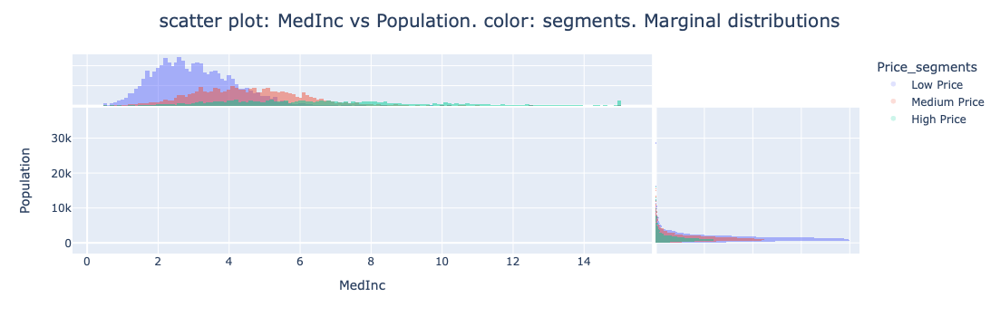

In [6]:
fig_individual = plot_individual_scatter_plot_segment(df = data,
                                                          feature_x = 'MedInc',
                                                          feature_y = 'Population',
                                                          var_segment = column_segment,
                                                          marginal_hist = True
                                                         )

fig_individual.write_html("output_eda/4_segmentation_analysis/individual_scatter_segmentation.html")
fig_individual.show()

In [7]:
fig_all = plot_all_features_scatter_plot_segment_mine(df = data, var_segment =  column_segment, number_columns=2)
fig_all.write_html("output_eda/4_segmentation_analysis/all_scatter_segmentation.html")
fig_all.write_image("output_eda/4_segmentation_analysis/all_scatter_segmentation.png")

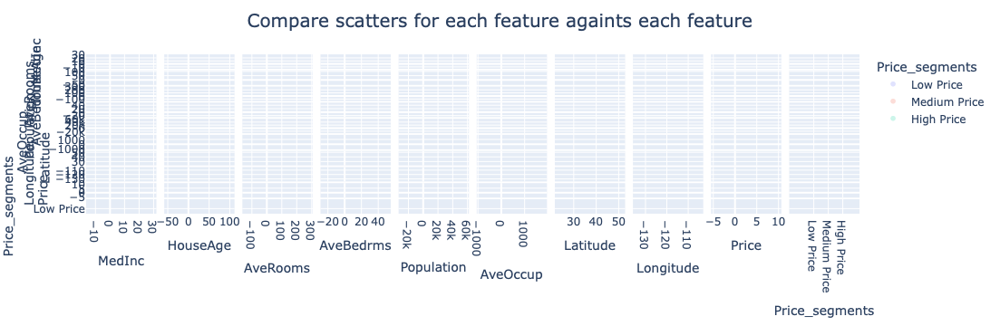

In [8]:
fig_matrix_scatter_all = plot_all_features_scatter_plot_segment(df = data,
                                                                var_segment = column_segment
                                                               )

fig_matrix_scatter_all.write_html("output_eda/4_segmentation_analysis/fig_matrix_scatter_all.html")

fig_matrix_scatter_all.show()